In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import math
import pandas as pd

#1. Image Fundamentals

In [13]:
def imshow(*args, figsize=10, to_rgb=True, title=None, fontsize=12):
    if isinstance(figsize, int):
        figsize = (figsize, figsize)
    images = args[0] if type(args[0]) is list else list(args)
    if to_rgb:
        images = list(map(lambda x: cv2.cvtColor(x, cv2.COLOR_BGR2RGB), images))
    if title is not None:
        assert len(title) == len(images), "Please provide a title for each image."
    plt.figure(figsize=figsize)
    for i in range(1, len(images)+1):
        plt.subplot(1, len(images), i)
        if title is not None:
            plt.title(title[i-1], fontsize=fontsize)
        plt.imshow(images[i-1])
        plt.axis('off')
    plt.show()

In [15]:
def hist(image):
	m, n = image.shape
	hist = [0.0] * 256
	for i in range(m):
		for j in range(n):
			hist[image[i, j]]+=1
	return np.array(hist)/(m*n)

In [ ]:
def cdf(hist):
	return [sum(hist[:i+1]) for i in range(len(hist))]

In [ ]:
def histeq(image):
	h = hist(image)
	cumsum = np.array(cdf(h))
	sk = np.uint8(255 * cumsum)
	s1, s2 = image.shape
	new_img = np.zeros_like(image)
	# applying transfered values for each pixels
	for i in range(0, s1):
		for j in range(0, s2):
			new_img[i, j] = sk[image[i, j]]
	Hist = hist(new_img)
	#return transformed image, original and new histogram, 
	# and transform function
	return new_img , Hist

##1.1. Quantization & Interpolation

###1.1.1. display the quantized image in (4,8,16,32,64,128) Levels and its histograms

In [14]:
elaine = cv2.imread('/content/sample_data/Elaine.bmp', cv2.IMREAD_GRAYSCALE)

In [ ]:
def quantize(image, n_bits):
    coeff = 2**8 // 2**n_bits
    coeff2= 2**8 // (2**n_bits - 1)
    return (image // coeff) * coeff2

In [ ]:
flat=elaine.flatten()

####Without HistEq

#####original image and hist

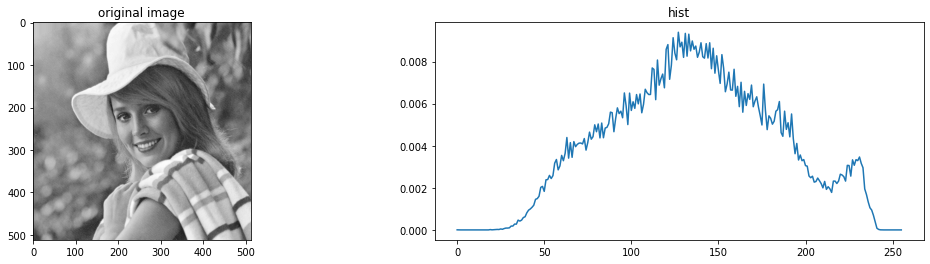

In [16]:
plt.subplot(121)
plt.imshow(elaine)
plt.title('original image')

orghist = hist(np.uint8(elaine))

plt.subplot(122)
plt.plot(orghist)
plt.title('hist')
plt.set_cmap('gray')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

##### 128 levels

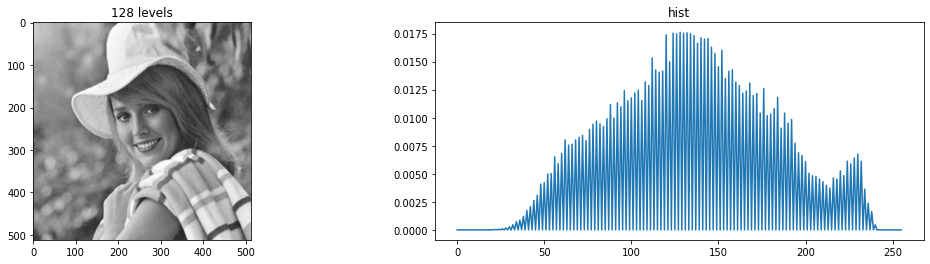

In [ ]:
img128levels = quantize(elaine,7)

plt.subplot(121)
plt.imshow(img128levels)
plt.title('128 levels')


hist128 = hist(np.uint8(img128levels))

plt.subplot(122)
plt.plot(hist128)
plt.title('hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####64 levels

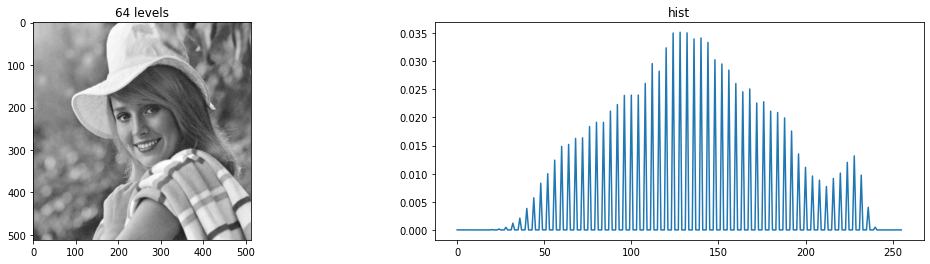

In [ ]:
img64levels = quantize(elaine,6)

plt.subplot(121)
plt.imshow(img64levels)
plt.title('64 levels')


hist64 = hist(np.uint8(img64levels))

plt.subplot(122)
plt.plot(hist64)
plt.title('hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####32 levels

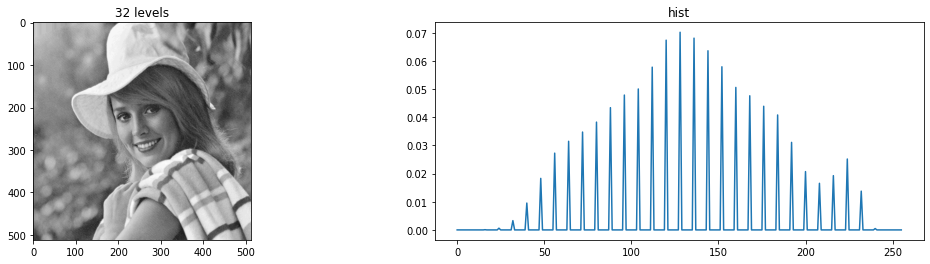

In [ ]:
img32levels = quantize(elaine,5)

plt.subplot(121)
plt.imshow(img32levels)
plt.title('32 levels')


hist32 = hist(np.uint8(img32levels))

plt.subplot(122)
plt.plot(hist32)
plt.title('hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####16 levels

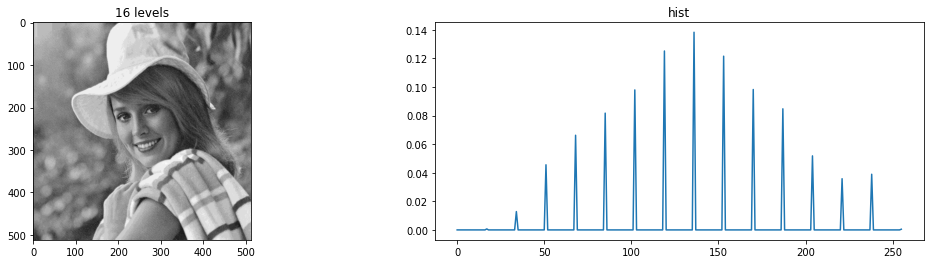

In [ ]:
img16levels = quantize(elaine,4)

plt.subplot(121)
plt.imshow(img16levels)
plt.title('16 levels')


hist16 = hist(np.uint8(img16levels))

plt.subplot(122)
plt.plot(hist16)
plt.title('hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####8 levels

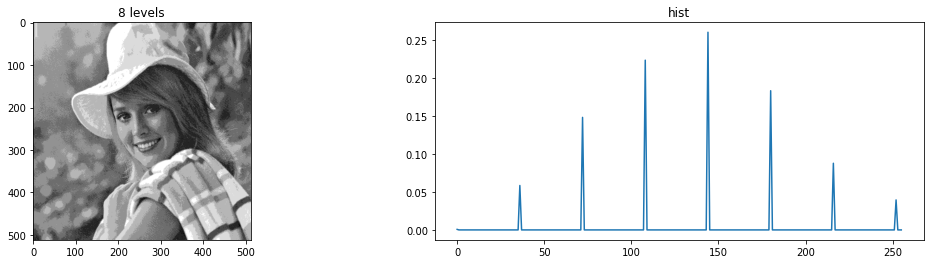

In [ ]:
img8levels = quantize(elaine,3)

plt.subplot(121)
plt.imshow(img8levels)
plt.title('8 levels')


hist8 = hist(np.uint8(img8levels))

plt.subplot(122)
plt.plot(hist8)
plt.title('hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####4 levels

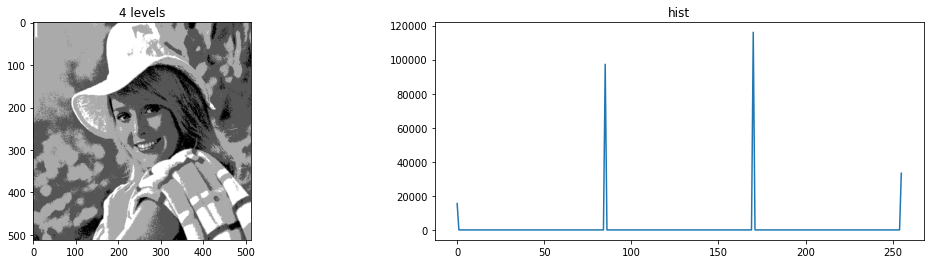

In [ ]:
img4levels = quantize(elaine,2)

plt.subplot(121)
plt.imshow(img4levels)
plt.title('4 levels')


hist4 = hist(np.uint8(img4levels))

plt.subplot(122)
plt.plot(hist4)
plt.title('hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

####With HistEq

#####original image and hist

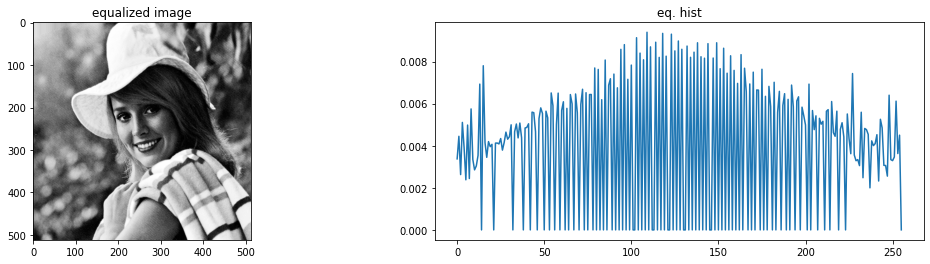

In [ ]:
new_img, histeqorg = histeq(np.uint8(elaine))

plt.subplot(121)
plt.imshow(new_img)
plt.title('equalized image')

plt.subplot(122)
plt.plot(histeqorg)
plt.title('eq. hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####128 levels

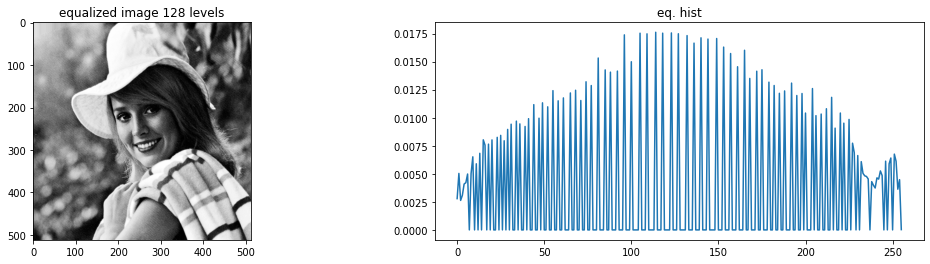

In [ ]:
img128levels = quantize(elaine, 7)
new_img128levels, histeq128 = histeq(np.uint8(img128levels))

plt.subplot(121)
plt.imshow(new_img128levels)
plt.title('equalized image 128 levels')

plt.subplot(122)
plt.plot(histeq128)
plt.title('eq. hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####64 levels

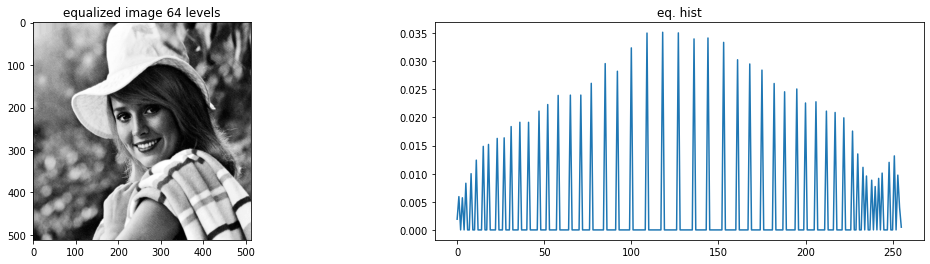

In [ ]:
img64levels = quantize(elaine, 6)
new_img64levels, histeq64 = histeq(np.uint8(img64levels))

plt.subplot(121)
plt.imshow(new_img64levels)
plt.title('equalized image 64 levels')

plt.subplot(122)
plt.plot(histeq64)
plt.title('eq. hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####32 levels

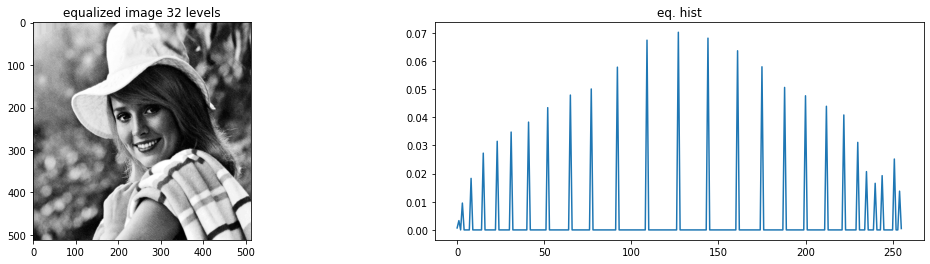

In [ ]:
img32levels = quantize(elaine, 5)
new_img32levels, histeq32 = histeq(np.uint8(img32levels))

plt.subplot(121)
plt.imshow(new_img32levels)
plt.title('equalized image 32 levels')

plt.subplot(122)
plt.plot(histeq32)
plt.title('eq. hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####16 levels

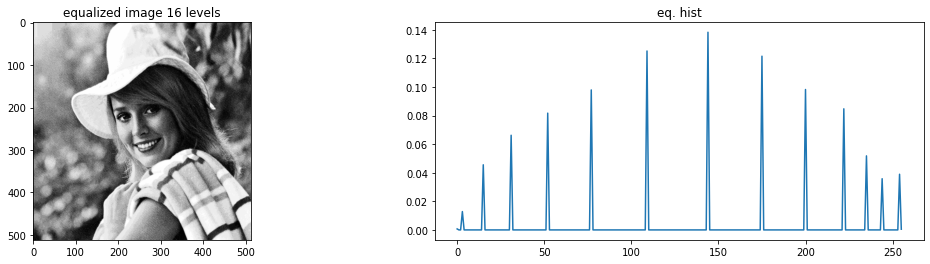

In [ ]:
img16levels = quantize(elaine, 4)
new_img16levels, histeq16 = histeq(np.uint8(img16levels))

plt.subplot(121)
plt.imshow(new_img16levels)
plt.title('equalized image 16 levels')

plt.subplot(122)
plt.plot(histeq16)
plt.title('eq. hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####8 levels

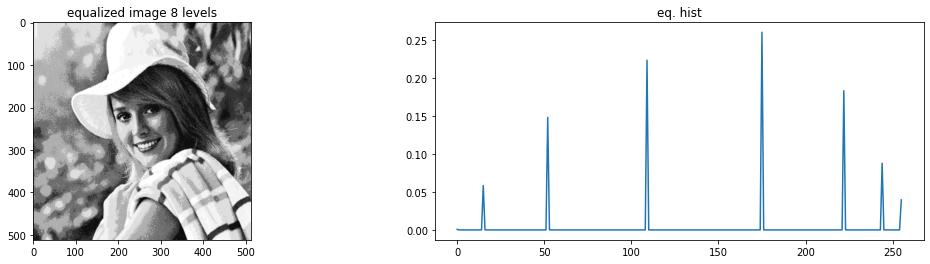

In [ ]:
img8levels = quantize(elaine, 3)
new_img8levels, histeq8 = histeq(np.uint8(img8levels))

plt.subplot(121)
plt.imshow(new_img8levels)
plt.title('equalized image 8 levels')

plt.subplot(122)
plt.plot(histeq8)
plt.title('eq. hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

#####4levels

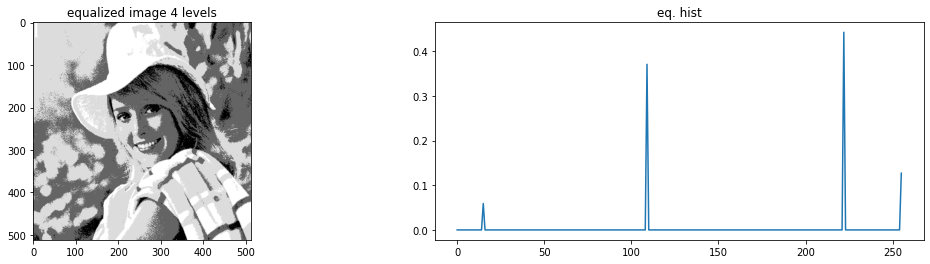

In [ ]:
img4levels = quantize(elaine, 2)
new_img4levels, histeq4 = histeq(np.uint8(img4levels))

plt.subplot(121)
plt.imshow(new_img4levels)
plt.title('equalized image 4 levels')

plt.subplot(122)
plt.plot(histeq4)
plt.title('eq. hist')
plt.subplots_adjust(right=2.5, wspace=0.1)
plt.show()

####MSE

In [ ]:
def MSE(x,y):
  return np.square(np.subtract(x,y)).mean()

In [ ]:
df = pd.DataFrame([('Without Histeq', MSE(elaine, img128levels), MSE(elaine, img64levels), MSE(elaine, img32levels),
                    MSE(elaine, img16levels), MSE(elaine, img8levels), MSE(elaine, img4levels)),
                   ('With Histeq', MSE(elaine, new_img128levels), MSE(elaine, new_img64levels), MSE(elaine, new_img32levels),
                    MSE(elaine, new_img16levels), MSE(elaine, new_img8levels), MSE(elaine, new_img4levels))],
                    columns=('Levels', '128', '64', '32', '16', '8', '4' ))

In [ ]:
df

,Levels,128,64,32,16,8,4
0,Without Histeq,0.509254,3.468834,17.381859,32.774803,76.570976,102.684330
1,With Histeq,102.832993,106.985451,106.654507,108.296638,108.791664,109.074158


###1.1.2. 

In [17]:
goldhill = cv2.imread('/content/sample_data/Goldhill.bmp', cv2.IMREAD_GRAYSCALE)

In [ ]:
goldhill.shape

(512, 512)

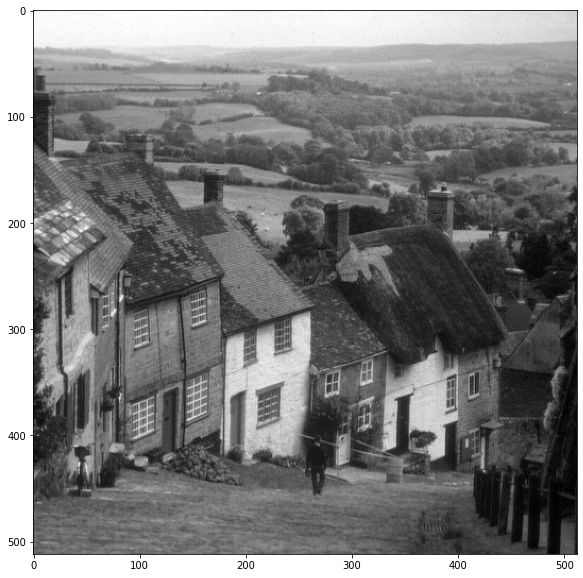

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(goldhill,cmap='gray')

####Downsample remove row&column

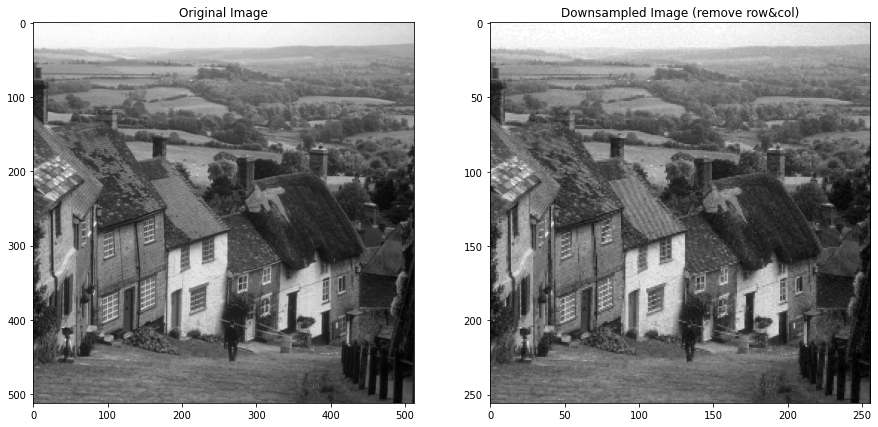

In [18]:
#remove row&column
rc_downsample = goldhill[0::2,0::2]

plt.figure(figsize=(15,12))

plt.subplot(121)
plt.imshow(goldhill,cmap = 'gray')
plt.title('Original Image')

plt.subplot(122)
plt.imshow(rc_downsample,cmap = 'gray')
plt.title('Downsampled Image (remove row&col)')

plt.show()

####Downsample averaging: from [here](https://stackoverflow.com/questions/60345747/downsample-numpy-image-array-in-python-by-averaging)

In [19]:
def down_sample_avg(im):
    original_width = im.shape[1]
    original_height = im.shape[0]
    width = original_width // 2
    height = original_height // 2
    resized_image = np.zeros(shape=(height, width), dtype=np.uint8)
    scale = 2
    for i in range(height):
        for j in range(width):
            temp = 0
            for x in range(scale):
                for y in range(scale):
                    temp += im[i*scale + x, j*scale + y]
            resized_image[i, j] = temp/(scale*scale)

    return resized_image

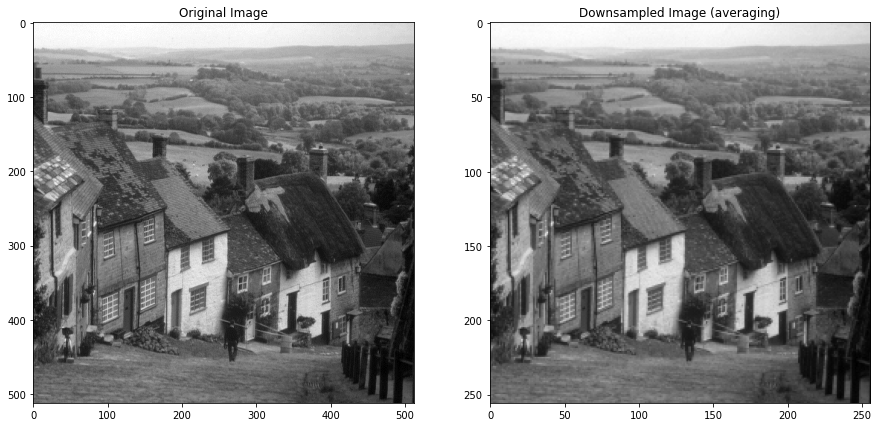

In [20]:
avg_downsample = down_sample_avg(goldhill)
plt.figure(figsize=(15,12))

plt.subplot(121)
plt.imshow(goldhill,cmap = 'gray')
plt.title('Original Image')

plt.subplot(122)
plt.imshow(avg_downsample,cmap = 'gray')
plt.title('Downsampled Image (averaging)')

plt.show()

####Upsample pixel replication (Nearest Neighbor Interpolation)
from [link](https://kwojcicki.github.io/blog/NEAREST-NEIGHBOUR).
alternate way from [here](https://gist.github.com/KeremTurgutlu/68feb119c9dd148285be2e247267a203)

In [21]:
def nearest(input,sx=512,sy=512):
  output = np.zeros((sx, sy), input.dtype)
  for y in range(len(output)):
    for x in range(len(output[y])):
      proj_x = x // 2
      proj_y = y // 2
      output[y][x] = input[proj_y][proj_x]

  return output

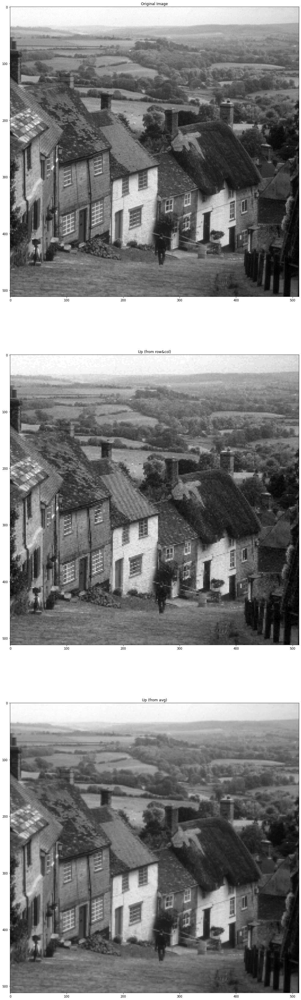

In [27]:
nn_rc_upsample = nearest(rc_downsample)
nn_avg_upsample = nearest(avg_downsample)

plt.figure(figsize=(30,60))

plt.subplot(311)
plt.imshow(goldhill,cmap = 'gray')
plt.title('Original Image')

plt.subplot(312)
plt.imshow(nn_rc_upsample,cmap = 'gray')
plt.title('Up (from row&col)')

plt.subplot(313)
plt.imshow(nn_avg_upsample,cmap = 'gray')
plt.title('Up (from avg)')

plt.show()

####Upsample bilinear interpolation (code from [here](https://stackoverflow.com/questions/70024313/resize-using-bilinear-interpolation-in-python))

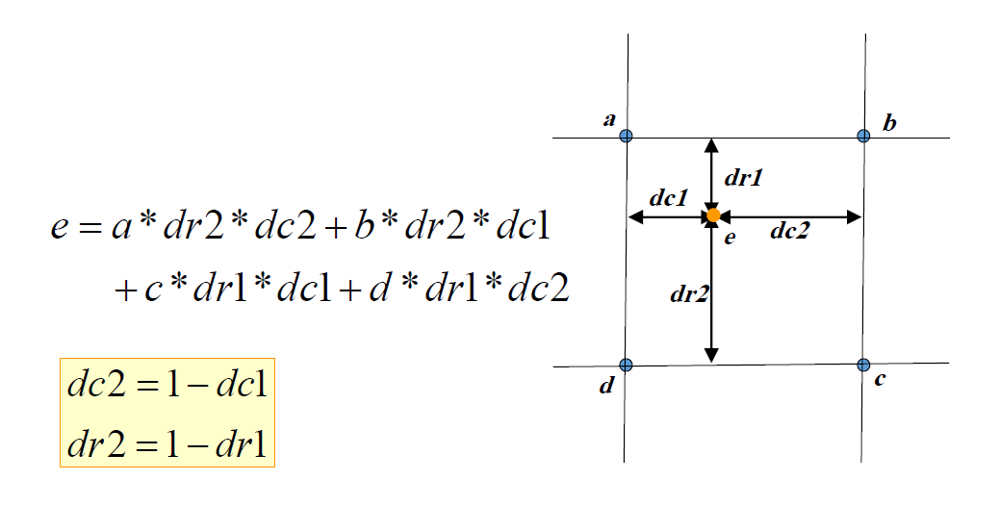

In [28]:
def bilinear_interpolation(image, y, x):
    height = image.shape[0]
    width = image.shape[1]

    x1 = max(min(math.floor(x), width - 1), 0)
    y1 = max(min(math.floor(y), height - 1), 0)

    x2 = max(min(math.ceil(x), width - 1), 0)
    y2 = max(min(math.ceil(y), height - 1), 0)

    a = float(image[y1, x1])
    b = float(image[y2, x1])
    c = float(image[y1, x2])
    d = float(image[y2, x2])

    dx = x - x1
    dy = y - y1

    new_pixel = a * (1 - dx) * (1 - dy)
    new_pixel += b * dy * (1 - dx)
    new_pixel += c * dx * (1 - dy)
    new_pixel += d * dx * dy
    return round(new_pixel)


def resize(image, new_height=512, new_width=512):
    new_image = np.zeros((new_height, new_width), image.dtype)  # new_image = [[0 for _ in range(new_width)] for _ in range(new_height)]

    orig_height = image.shape[0]
    orig_width = image.shape[1]

    # Compute center column and center row
    x_orig_center = (orig_width-1) / 2
    y_orig_center = (orig_height-1) / 2

    # Compute center of resized image
    x_scaled_center = (new_width-1) / 2
    y_scaled_center = (new_height-1) / 2

    # Compute the scale in both axes
    scale_x = orig_width / new_width;
    scale_y = orig_height / new_height;

    for y in range(new_height):
        for x in range(new_width):
            x_ = (x - x_scaled_center) * scale_x + x_orig_center
            y_ = (y - y_scaled_center) * scale_y + y_orig_center
            new_image[y, x] = bilinear_interpolation(image, y_, x_)

    return new_image

In [29]:
bi_rc_upsample = resize(rc_downsample)
bi_avg_upsample = resize(avg_downsample)

plt.figure(figsize=(30,60))

plt.subplot(311)
plt.imshow(goldhill,cmap = 'gray')
plt.title('Original Image')

plt.subplot(312)
plt.imshow(bi_rc_upsample,cmap = 'gray')
plt.title('Up (from row&col)')

plt.subplot(313)
plt.imshow(bi_avg_upsample,cmap = 'gray')
plt.title('Up (from avg)')

plt.show()

Output hidden; open in https://colab.research.google.com to view.

####MSE

In [ ]:
df = pd.DataFrame([('Averaging', MSE(goldhill, nn_avg_upsample), MSE(goldhill, bi_avg_upsample)),
                   ('Remove Row&Columns', MSE(goldhill, nn_rc_upsample), MSE(goldhill, bi_rc_upsample))],
                    columns=('', 'Pixel Replication', 'Bilinear Interpolation'))

In [ ]:
df

,,Pixel Replication,Bilinear Interpolation
0,Averaging,35.253479,36.820927
1,Remove Row&Columns,23.089600,41.719284


###1.1.3 Create new images using 5, 4, 3, 2 and 1 bit only for each pixel. *How many bits are needed to preserve image quality? Does it change from place to place in the image? Discuss about the results.*

In [3]:
barbara = cv2.imread('/content/sample_data/Barbara.bmp', cv2.IMREAD_GRAYSCALE)

In [4]:
def quantize2(image, n_bits):
    coeff = 2**8 // 2**n_bits
    return (image // coeff)

####5bit

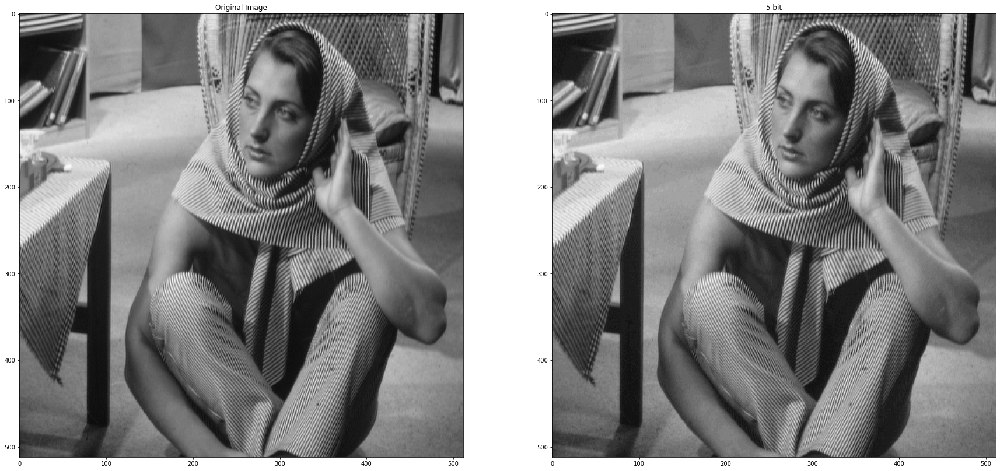

In [6]:
img5bit = quantize2(barbara, 5)

plt.figure(figsize=(30,30))
plt.set_cmap('gray')

plt.subplot(121)
plt.imshow(barbara)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(img5bit)
plt.title('5 bit')
plt.show()

####4bit

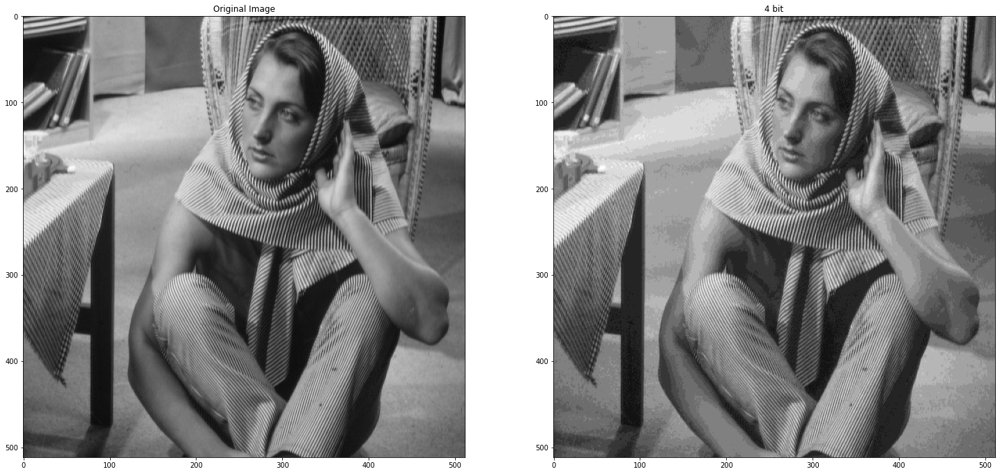

In [7]:
img4bit = quantize2(barbara, 4)

plt.figure(figsize=(25,25))
plt.set_cmap('gray')

plt.subplot(121)
plt.imshow(barbara)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(img4bit)
plt.title('4 bit')
plt.show()

####3bit

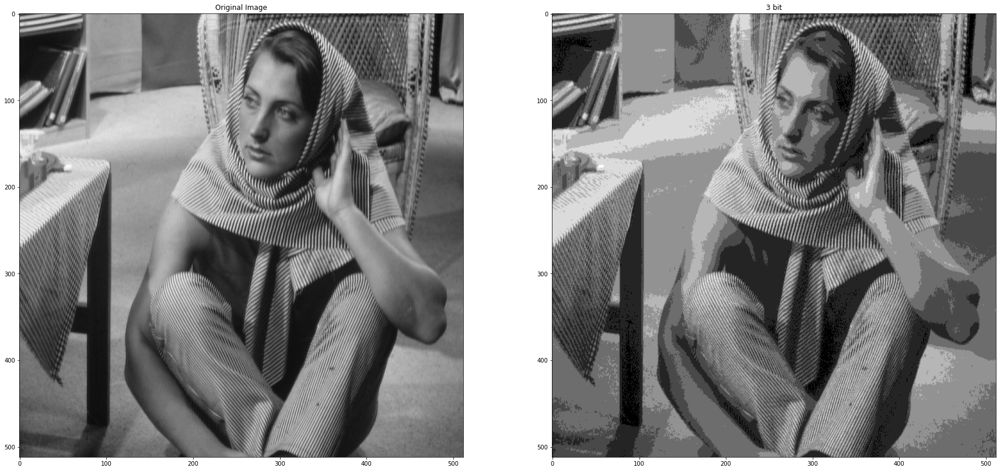

In [8]:
img3bit = quantize2(barbara, 3)

plt.figure(figsize=(30,30))
plt.set_cmap('gray')

plt.subplot(121)
plt.imshow(barbara)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(img3bit)
plt.title('3 bit')
plt.show()

####2bit

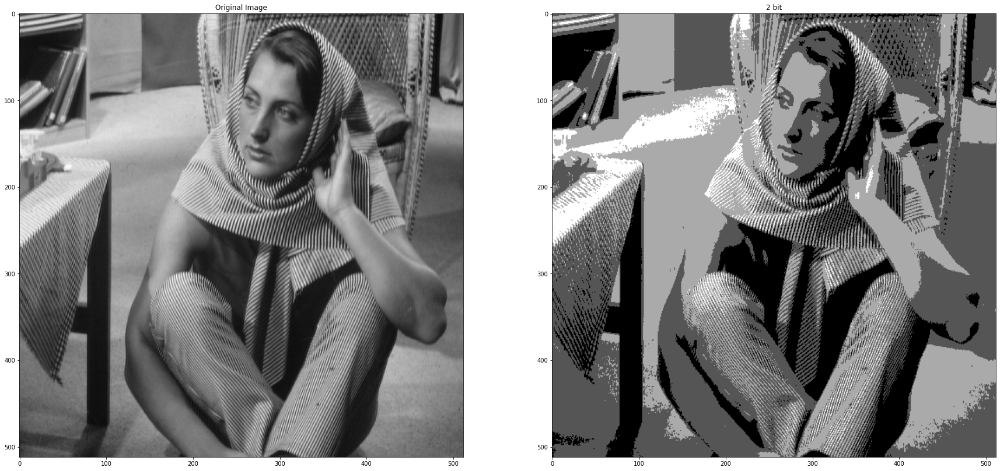

In [9]:
img2bit = quantize2(barbara, 2)

plt.figure(figsize=(30,30))
plt.set_cmap('gray')

plt.subplot(121)
plt.imshow(barbara)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(img2bit)
plt.title('2 bit')
plt.show()

####1bit

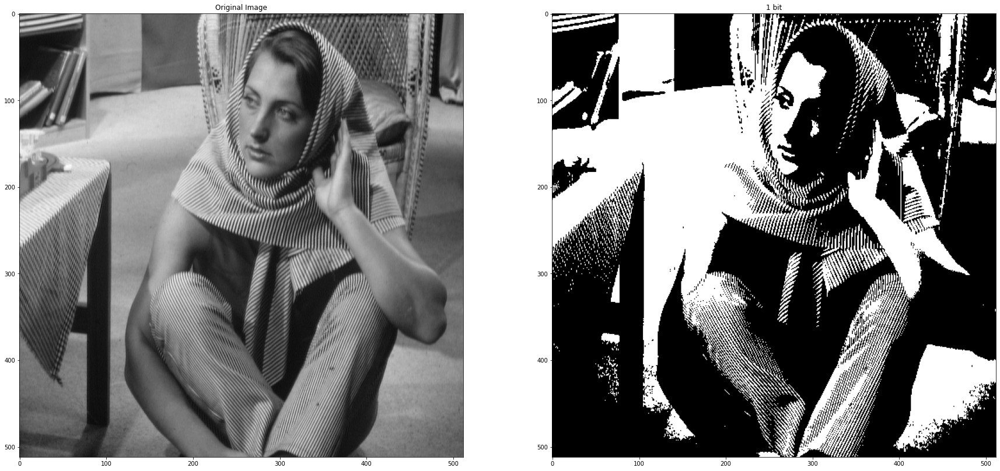

In [10]:
img1bit = quantize2(barbara, 1)

plt.figure(figsize=(30,30))
plt.set_cmap('gray')

plt.subplot(121)
plt.imshow(barbara)
plt.title('Original Image')

plt.subplot(122)
plt.imshow(img1bit)
plt.title('1 bit')
plt.show()